출처: https://musicinformationretrieval.com/

In [102]:
%matplotlib inline
import seaborn
import scipy, scipy.signal
import IPython.display as ipd
import librosa, librosa.display
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams['figure.figsize'] = (6, 2)

# Feature Sonification

1. 오디오 신호의 onset을 감지

2. 각 onset에서 오디오 신호를 분할

3. 각 세그먼트에 대한 feature을 계산

4. 각 세그먼트를 개별적으로 청취하여 feature에 대한 직관을 얻음


## Step 1: Retrieve Audio

In [158]:
x, sr = librosa.load('../audio/125_bounce.wav')
print(sr)
ipd.Audio(x, rate=sr)

22050


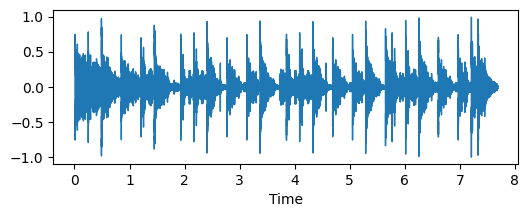

In [159]:
librosa.display.waveshow(x, sr=sr)
plt.show()

In [160]:
# Compute the short-time Fourier transform:
X = librosa.stft(x)

In [161]:
# For display purposes, compute the log amplitude of the STFT:
Xmag = librosa.amplitude_to_db(X)

C:\Users\JHCho\anaconda3\envs\mir\lib\site-packages\librosa\util\decorators.py:88: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  return f(*args, **kwargs)


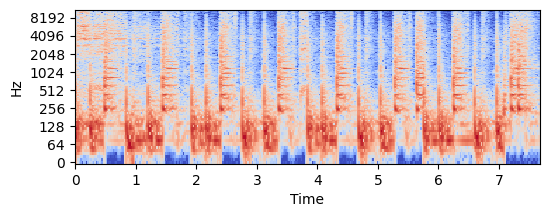

In [162]:
# Play with the parameters, including x_axis and y_axis
librosa.display.specshow(Xmag, sr=sr, x_axis='time', y_axis='log')
plt.show()

## Step 2: Detect Onsets

In [163]:
# Find the times, in seconds, when onsets occur in the audio signal.
onset_frames = librosa.onset.onset_detect(y=x, sr=sr)
print(onset_frames)

[ 12  22  37  43  53  63  74  79  84  94 104 120 126 135 146 157 162 167
 177 187 203 208 218 228 244 260 270 285 291 301 307 311 317]


In [164]:
onset_times = librosa.frames_to_time(onset_frames, sr=sr)
print(onset_times)

[0.27863946 0.510839   0.85913832 0.99845805 1.2306576  1.46285714
 1.71827664 1.83437642 1.95047619 2.18267574 2.41487528 2.78639456
 2.92571429 3.13469388 3.39011338 3.64553288 3.76163265 3.87773243
 4.10993197 4.34213152 4.71365079 4.82975057 5.06195011 5.29414966
 5.66566893 6.03718821 6.26938776 6.61768707 6.7570068  6.98920635
 7.12852608 7.2214059  7.36072562]


In [165]:
# Convert the onset frames into sample indices.
onset_samples = librosa.frames_to_samples(onset_frames)
print(onset_samples)

[  6144  11264  18944  22016  27136  32256  37888  40448  43008  48128
  53248  61440  64512  69120  74752  80384  82944  85504  90624  95744
 103936 106496 111616 116736 124928 133120 138240 145920 148992 154112
 157184 159232 162304]


In [166]:
## Play a "beep" at each onset.
# Use the `length` parameter so the click track is the same length as the original signal
clicks = librosa.clicks(times=onset_times, length=len(x))

In [167]:
# Play the click track "added to" the original signal
ipd.Audio(x+clicks, rate=sr)

## Step 3: Segment the Audio

In [168]:
# Save into an array, segments, 100-ms segments beginning at each onset.
frame_sz = int(0.100*sr)
segments = np.array([x[i:i+frame_sz] for i in onset_samples])

In [169]:
# Here is a function that adds 300 ms of silence onto the end of each segment and concatenates them into one signal.
# Later, we will use this function to listen to each segment, perhaps sorted in a different order.

def concatenate_segments(segments, sr=22050, pad_time=0.300):
    padded_segments = [np.concatenate([segment, np.zeros(int(pad_time*sr))]) for segment in segments]
    return np.concatenate(padded_segments)

In [170]:
concatenated_signal = concatenate_segments(segments, sr)

In [171]:
ipd.Audio(concatenated_signal, rate=sr)

## Step 4: Extract Features

In [172]:
# For each segment, compute the zero crossing rate.
zcrs = [sum(librosa.core.zero_crossings(segment)) for segment in segments]
print(zcrs)

[365, 559, 42, 245, 114, 476, 415, 555, 76, 67, 505, 36, 127, 46, 523, 327, 662, 77, 58, 513, 39, 149, 48, 522, 455, 44, 500, 31, 136, 50, 182, 499, 557]


In [173]:
# Use argsort to find an index array, ind, such that segments[ind] is sorted by zero crossing rate.
ind = np.argsort(zcrs)
print(ind)

[27 11 20  2 25 13 22 29 18  9  8 17  4 12 28 21 30  3 15  0  6 24  5 31
 26 10 19 23 14  7 32  1 16]


In [174]:
# Sort the segments by zero crossing rate, and concatenate the sorted segments.
concatenated_signal = concatenate_segments(segments[ind], sr)

## Step 5: Listen to Segments

In [175]:
ipd.Audio(concatenated_signal, rate=sr)

# Tuning Systems

- 12음계 equal temperament에서 옥타브 내의 12개 반음은 모두 같은 폭을 갖는다. 주파수 비율로 표현되는 이 튜닝 시스템에서 한 반음의 간격은 21/12이다. 센트(cent)로 표시되며, 이 간격은 100센트로 정의된다. 그러므로 옥타브는 1200센트이다.

- 순정률(just intonation)에서 주파수 비율은 두 개의 작은 정수 사이의 분수로 표현된다(예를 들어 3:2, 4:3). 결과적으로, 두 음 사이의 더 높은 harmonic partials이 겹쳐서, 귀에 듣기 좋은 자음(consonant) 간격이 생기게 될 것이다. 5-리미트 just tuning에서 이러한 분수는 5 이하의 주요 인자, 즉 {2, 3, 5}로 표현된다. 7-리미트 just tuning에서 이러한 분수는 7 이하의 주요 인자, 즉 {2, 3, 5, 7}로 표현된다. 예를 들어 7:4는 7-리미트 간격이지만 5-리미트 간격은 아니다.

- 피타고라스 음률(Pythagorean tuning)에서 모든 주파수 비율은 3:2의 비율에 기초한다. 이 비율을 찾으려면 간격의 한 음표에서 간격의 다른 음표에 도달할 때까지 다섯 번째 원 주위를 돌면서 각 단계와 함께 3/2을 곱하거나 나눈다. 마지막으로 관심 있는 옥타브로 돌아갈 수 있도록 2배를 곱하거나 나눈다. 피타고라스의 튜닝은 또한 모든 비율이 3 이하의 주요 요소만을 사용하기 때문에 just tuning만 해도 3-리미트로 간주될 수 있다.

In [27]:
T = 5     # duration in seconds
sr = 22050  # sampling rate in Hertz
fcutoff = 4000 # frequency cutoff for filter

In [28]:
def simulate_tone(f0, harmonics=None):
    """Returns a tone with a specified fundamental frequency and harmonic amplitudes."""
    if harmonics is None:
        harmonics = [1]
    t = np.linspace(0, T, T*sr, endpoint=False)
    x = sum(v*np.sin(2*scipy.pi*i*f0*t) for i, v in enumerate(harmonics, 1))
    return x

In [29]:
def filter_tone(x, fcutoff=None):
    """Return a low-pass filtered signal."""
    if fcutoff is None:
        fcutoff = sr/2.0
    h = scipy.signal.firwin(55, 2*float(fcutoff)/sr)
    y = np.convolve(x, h)
    return y

In [78]:
def make_double_stop(ratio, f0=440, harmonics=None):
    """Listen to two tones played simultaneously, and plot the tones' spectra."""
    if harmonics is None:
        harmonics = [1]
    f1 = ratio*f0
    
    # Generate both tones.
    x0 = filter_tone(simulate_tone(f0, harmonics=harmonics), fcutoff=fcutoff)
    x1 = filter_tone(simulate_tone(f1, harmonics=harmonics), fcutoff=fcutoff)
    
    # Add both tones, and normalize.
    y = x0 + x1
    y = 0.5*y/y.max()
    
    # Generate both spectra.
    X0 = scipy.fft.fft(x0)
    X1 = scipy.fft.fft(x1)

    # Create frequency variable.
    N = len(X0)
    f = np.linspace(0, sr, N, endpoint=False)
    
    # Plot spectrum of both notes.
    plt.semilogy(f, abs(X0), marker='o', linewidth=1)
    plt.semilogy(f, abs(X1), color='r', linewidth=1)
    
    plt.xlim(xmin=0, xmax=(len(harmonics)+1)*(f1 if ratio > 1 else f0))
    plt.ylim(ymin=0.1)
    
    plt.xlabel('Frequency (Hz)')
    plt.legend(('f0 = %.2f Hz' % f0, 'f0 = %.2f Hz' % f1))
    
    # Output audio widget.
    print('ratio between notes:', ratio)
    print('difference in cents:', np.log2(ratio)*1200)
    return ipd.Audio(y, rate=sr)

**Unison**

ratio between notes: 1
difference in cents: 0.0


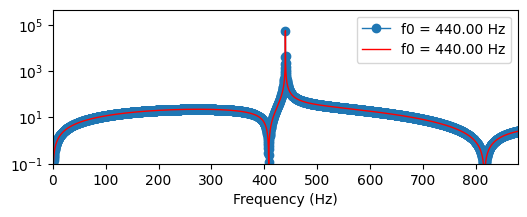

In [79]:
make_double_stop(1)

**Octaves**

ratio between notes: 2
difference in cents: 1200.0


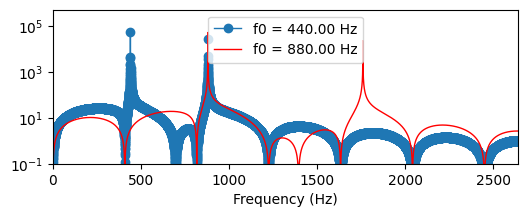

In [77]:
harmonics = [1.0, 0.5]

# Just intonation or equal temperament, 12 semitones, 1200 cents:
make_double_stop(2, harmonics=harmonics)

**Pythagorean tuning**, twelve steps forward on the Circle of Fifths. 

- 피타고라스 조율에서 기본 주파수에 3/2을 12배 곱한 다음, 관심 옥타브로 돌아갈 수 있을 만큼 충분한 2배로 나눈다.
    - $ \left( \frac{3}{2} \right)^{12} \left( \frac{1}{2} \right)^6 = \frac{531441}{262144} \approx 2.0273 $

ratio between notes: 2.0272865295410156
difference in cents: 1223.4600103846492


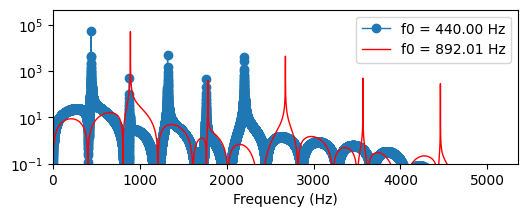

In [44]:
# Pythagorean tuning, twelve steps forward on the Circle of Fifths.
make_double_stop(531441.0/262144, harmonics=harmonics)

**Fifths**

In [45]:
harmonics = [1.0, 0.1, 0.1]

ratio between notes: 1.4983070768766815
difference in cents: 700.0


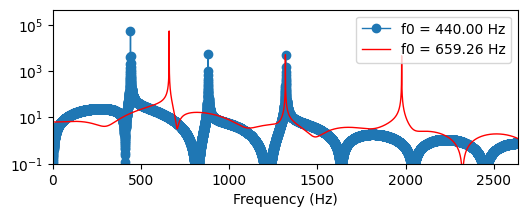

In [46]:
# Equal temperament, seven semitones, 700 cents:
make_double_stop(2**(7.0/12), harmonics=harmonics)

ratio between notes: 1.5
difference in cents: 701.9550008653874


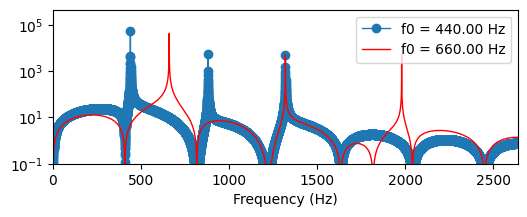

In [47]:
# Just intonation or Pythagorean tuning, one step forward on the Circle of Fifths:
make_double_stop(3.0/2, harmonics=harmonics)

**Fourth**

In [49]:
harmonics = [1.0, 0.01, 0.1, 0.1]

ratio between notes: 1.3333333333333333
difference in cents: 498.0449991346125


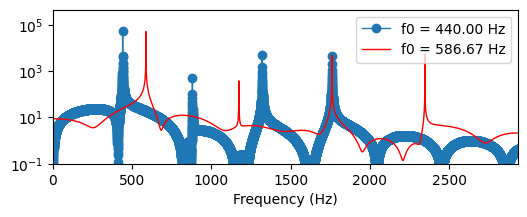

In [50]:
# Just intonation or Pythagorean tuning, one step backward on the Circle of Fifths
make_double_stop(4.0/3, harmonics=harmonics)

ratio between notes: 1.3348398541700344
difference in cents: 500.0


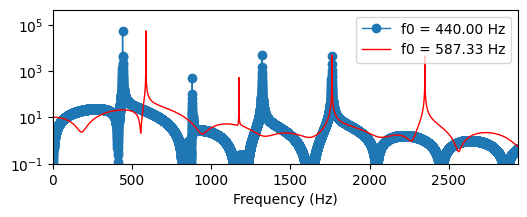

In [51]:
# Equal temperament, five semitones:
make_double_stop(2**(5.0/12), harmonics=harmonics)

**Major Sixths**

In [52]:
harmonics = [1.0, 0.01, 0.1, 0.01, 0.1]

ratio between notes: 1.6666666666666667
difference in cents: 884.3587129994474


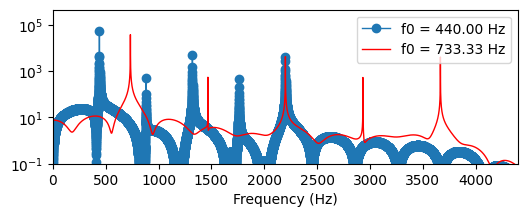

In [53]:
# Just innotation
make_double_stop(5.0/3, harmonics=harmonics)

ratio between notes: 1.681792830507429
difference in cents: 899.9999999999999


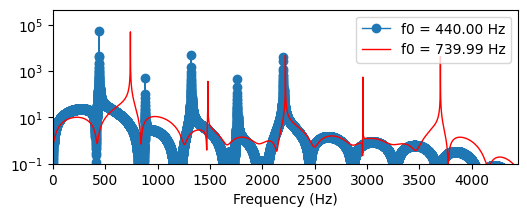

In [54]:
# Equal temperament, i.e. nine semitones:
make_double_stop(2**(9.0/12), harmonics=harmonics)

ratio between notes: 1.6875
difference in cents: 905.8650025961623


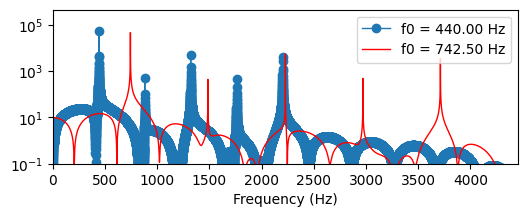

In [55]:
# Pythagorean tuning, three steps forward on the Circle of Fifths:
make_double_stop(27.0/16, harmonics=harmonics)

**Minor Thirds**

In [56]:
harmonics = [1.0, 0.01, 0.01, 0.01, 0.1, 0.1]

ratio between notes: 1.1851851851851851
difference in cents: 294.13499740383764


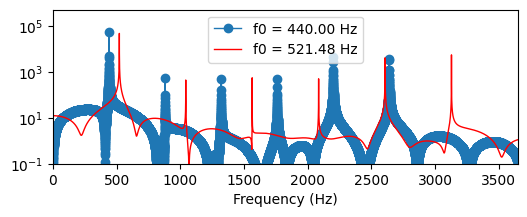

In [59]:
# Pythagorean tuning, three steps backward on the Circle of Fifths:
make_double_stop(32.0/27, harmonics=harmonics)

ratio between notes: 1.189207115002721
difference in cents: 299.99999999999994


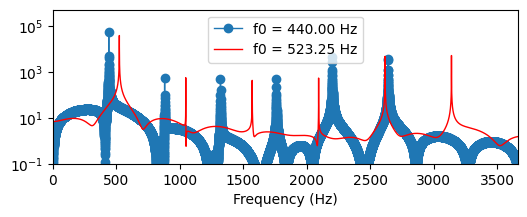

In [60]:
# Equal temperament, three semitones:
make_double_stop(2**(3.0/12), harmonics=harmonics)

ratio between notes: 1.2
difference in cents: 315.64128700055255


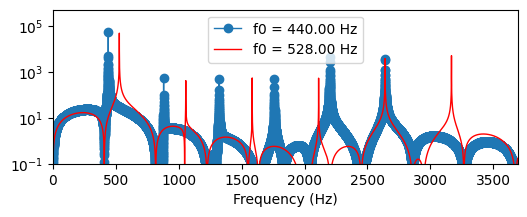

In [61]:
# Just intonation:
make_double_stop(6.0/5, harmonics=harmonics)

**Major Thirds**

In [62]:
harmonics = [1.0, 0.01, 0.01, 0.1, 0.1]

ratio between notes: 1.25
difference in cents: 386.3137138648348


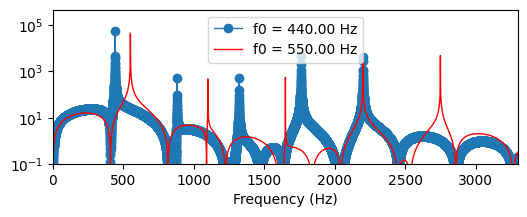

In [63]:
# Just intonation:
make_double_stop(5.0/4, harmonics=harmonics)

ratio between notes: 1.2599210498948732
difference in cents: 400.00000000000006


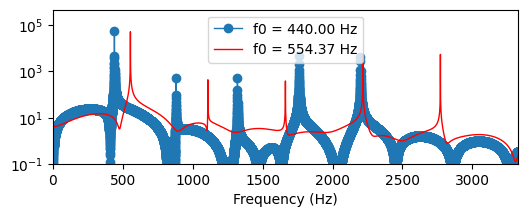

In [64]:
# Equal temperament, four semitones:
make_double_stop(2**(4.0/12), harmonics=harmonics)

ratio between notes: 1.265625
difference in cents: 407.8200034615497


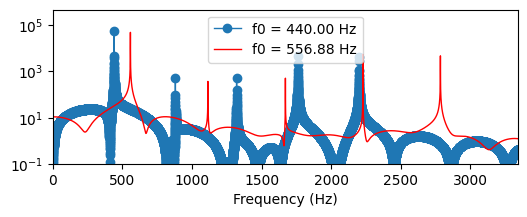

In [66]:
# Pythagorean tuning, four steps forward on the Circle of Fifths:
make_double_stop(81.0/64, harmonics=harmonics)

**Minor Sixths**

In [67]:
harmonics = [1.0, 0.001, 0.001, 0.001, 0.01, 0.001, 0.001, 0.01]

ratio between notes: 1.5802469135802468
difference in cents: 792.1799965384502


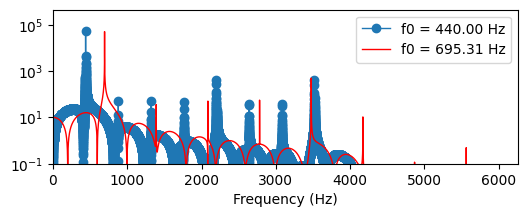

In [68]:
# Pythagorean tuning, four steps backward on the Circle of Fifths:
make_double_stop(128.0/81, harmonics=harmonics)

ratio between notes: 1.5874010519681994
difference in cents: 799.9999999999998


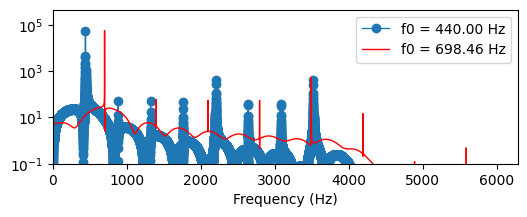

In [69]:
# Equal temperament, eight semitones:
make_double_stop(2**(8.0/12), harmonics=harmonics)

ratio between notes: 1.6
difference in cents: 813.6862861351652


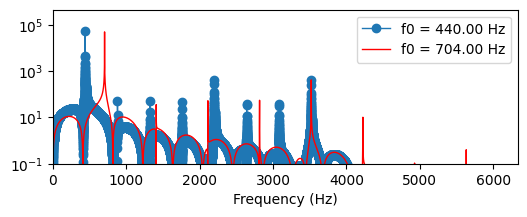

In [70]:
# Just intonation:
make_double_stop(8.0/5, harmonics=harmonics)

**Major Seconds**

In [71]:
harmonics = [1.0, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.1, 0.1, 0.1]

ratio between notes: 1.1111111111111112
difference in cents: 182.40371213406007


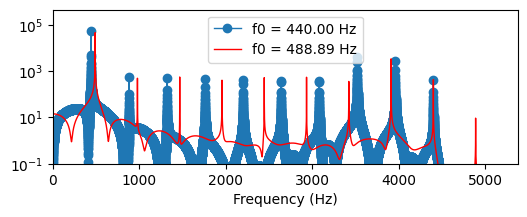

In [72]:
# Just intonation (minor tone a.k.a. lesser tone)
# Observe how the tenth harmonic of the lower note aligns with the ninth harmonic of the upper note.
make_double_stop(10.0/9, harmonics=harmonics)

ratio between notes: 1.122462048309373
difference in cents: 200.00000000000006


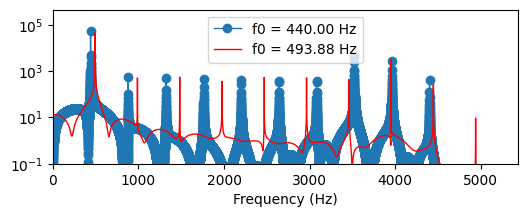

In [73]:
# Equal temperament, two semitones:
make_double_stop(2**(2.0/12), harmonics=harmonics)

ratio between notes: 1.125
difference in cents: 203.91000173077484


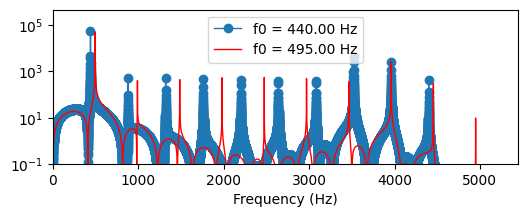

In [74]:
# Just intonation (major tone a.k.a. greater tone) or Pythagorean tuning, two steps forward on the Circle of Fifths:
# Observe how the ninth harmonic of the lower note aligns with the eighth harmonic of the upper note.
make_double_stop(9.0/8, harmonics=harmonics)

**Minor Sevenths**

In [80]:
harmonics = [1.0, 0.01, 0.01, 0.1, 0.1, 0.01, 0.1, 0.01, 0.1]

ratio between notes: 1.75
difference in cents: 968.8259064691249


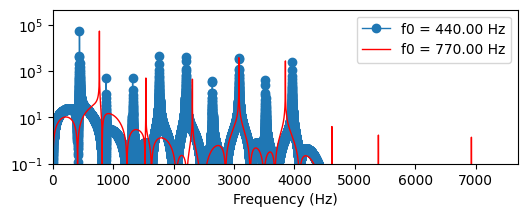

In [81]:
# 7-limit just intonation, a.k.a. septimal minor seventh, harmonic seventh, or subminor seventh:
make_double_stop(7.0/4, harmonics=harmonics)

ratio between notes: 1.7777777777777777
difference in cents: 996.089998269225


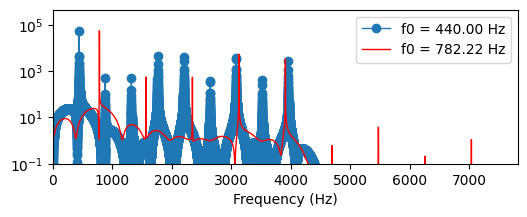

In [82]:
# Pythagorean tuning, two steps backward on the Circle of Fifths, or small just minor seventh:
make_double_stop(16.0/9, harmonics=harmonics)

ratio between notes: 1.7817974362806785
difference in cents: 999.9999999999999


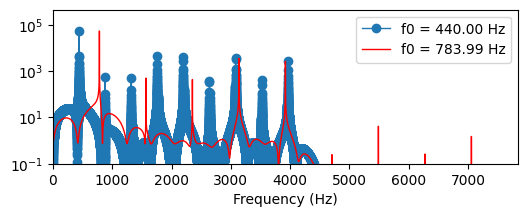

In [83]:
# Equal temperament, ten semitones:
make_double_stop(2**(10.0/12), harmonics=harmonics)

ratio between notes: 1.8
difference in cents: 1017.5962878659401


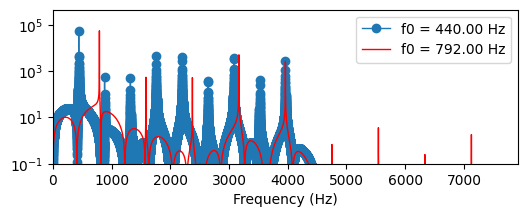

In [84]:
# 5-limit just intonation, a.k.a. large just minor seventh:
make_double_stop(9.0/5, harmonics=harmonics)

**Major Sevenths**

In [85]:
harmonics = [1.0,] * 15

ratio between notes: 1.875
difference in cents: 1088.2687147302222


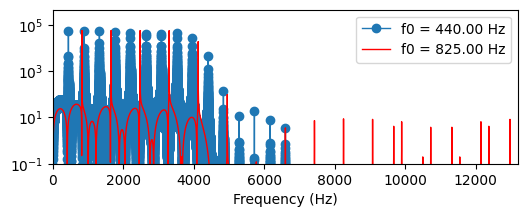

In [86]:
# Just intonation:
make_double_stop(15.0/8, harmonics=harmonics)

ratio between notes: 1.887748625363387
difference in cents: 1100.0


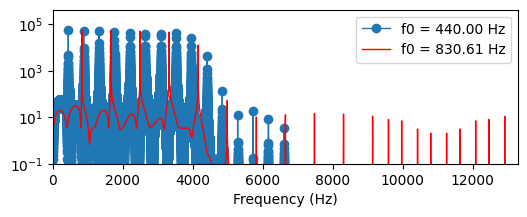

In [87]:
# Equal temperament, eleven semitones:
make_double_stop(2**(11.0/12), harmonics=harmonics)

ratio between notes: 1.8984375
difference in cents: 1109.775004326937


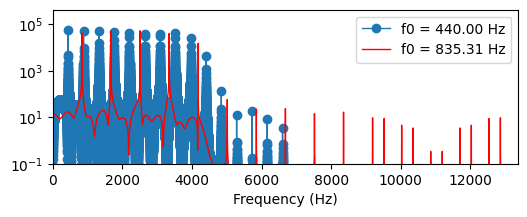

In [88]:
# Pythagorean tuning, five steps forward on the Circle of Fifths:
make_double_stop(243.0/128, harmonics=harmonics)

**Minor Seconds**

In [92]:
harmonics = [0.01,] * 16
harmonics[0] = 1.0
harmonics[14] = 0.1
harmonics[15] = 0.1
print(harmonics)

[1.0, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.1, 0.1]


ratio between notes: 1.0534979423868314
difference in cents: 90.22499567306306


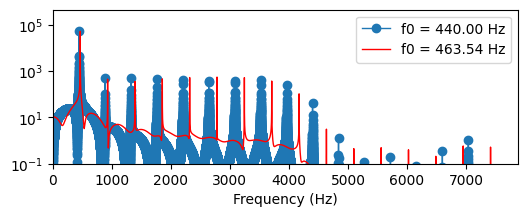

In [93]:
# Pythagorean tuning, five steps backward on the Circle of Fifths:
make_double_stop(256.0/243, harmonics=harmonics)

ratio between notes: 1.0594630943592953
difference in cents: 100.00000000000007


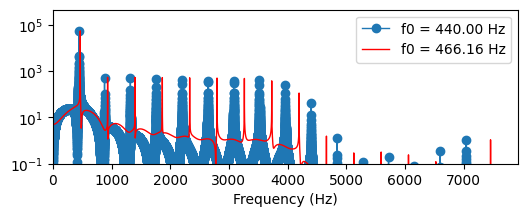

In [94]:
# Equal temperament, one semitone:
make_double_stop(2**(1.0/12), harmonics=harmonics)

ratio between notes: 1.0666666666666667
difference in cents: 111.73128526977774


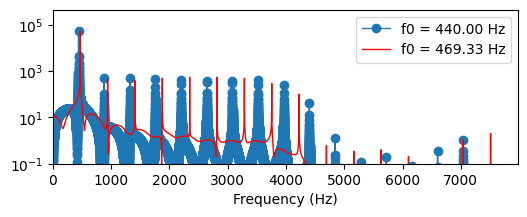

In [95]:
# Just intonation:
make_double_stop(16.0/15, harmonics=harmonics)

**Tritone, Augmented Fourths, Diminished Fifths**

ratio between notes: 1.4046639231824416
difference in cents: 588.2699948076754


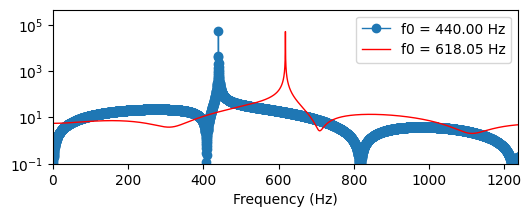

In [97]:
# Diminished fifth, Pythagorean tuning, six steps backward on the Circle of Fifths:
make_double_stop(1024.0/729)

ratio between notes: 1.40625
difference in cents: 590.2237155956096


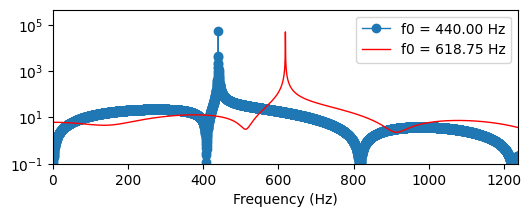

In [98]:
# Augmented fourth:
make_double_stop(45.0/32)

ratio between notes: 1.4142135623730951
difference in cents: 600.0000000000001


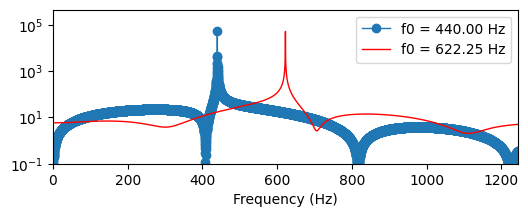

In [99]:
# Equal temperament, six semitones, 600 cents:
make_double_stop(2**(6.0/12))

ratio between notes: 1.4222222222222223
difference in cents: 609.7762844043904


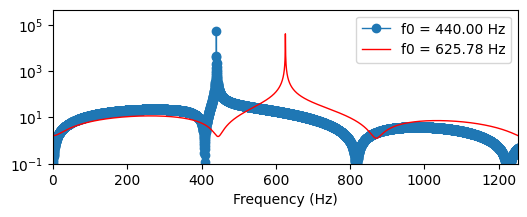

In [100]:
# Diminished fifth:
make_double_stop(64.0/45)

ratio between notes: 1.423828125
difference in cents: 611.7300051923246


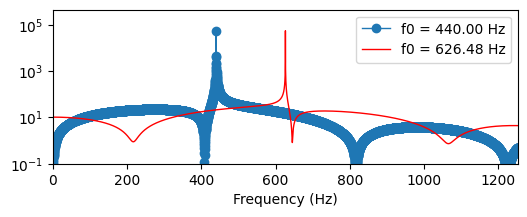

In [101]:
# Augmented fourth, Pythagorean tuning, six steps forward on the Circle of Fifths:
make_double_stop(729.0/512)